In [1]:
using ControlSystemsBase, LinearAlgebra, Plots, Statistics

First, we start by a simple LQR control design of the following linear system:

In [2]:
Δ = 0.1
A = [1.0 Δ; 0 1.0];
B = [0; Δ;;];
C = I;
D = 0;
sys = ss(A,B,C,D,Δ)

V = [2;;]
W = diagm([0.1, 0.05])

Q = I
R = 2I

K_LQR = -lqr(sys, Q, R)

display(K_LQR)

1×2 Matrix{Float64}:
 -0.659841  -1.35819

We can also achieve the same optimal controller using the controllability-type Gramian, i.e., via LMIs in an SDP (Problem~2 in the paper):

In [8]:
using JuMP
using MosekTools, SCS

In [9]:
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]
@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])
@objective(model, Min, tr(Q*Σ) + tr(R*Z₀))
@constraint(model, Σ-1e-5*I >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
@constraint(model, Σ - (A*Σ*A' + B*L*A' +
 A*L'*B' +  B*Z₀*B' + W + B*V*B') >= 0, PSDCone());
@constraint(model, Σ - (A*Σ*A' + B*L*A' +
 A*L'*B' +  B*Z₀*B' + W + B*V*B') <= 0, PSDCone());

set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_LMI = L * inv(Σ) 

1×2 Matrix{Float64}:
 -0.65984  -1.3582

The error between the two control gains:

In [10]:
norm(K_LMI - K_LQR, 2) # the two norm of the difference.

1.0128989500242757e-5

We now seek to do the previous step again, but with $(A,B)$ being identified from data.

First, we use the double integrator model above, to generate noisy data, under a stabilizing controller $K_0$ and a persistently exciting additive input $v_k$. That is, $u_k = K_0 x_k + v_k$.

In [13]:
function f(x::Vector{Float64}, u::Vector{Float64})
    x⁺ = zero.(x);
    x⁺ = A * x + B * u + sqrt(W) * randn(size(x⁺))
    return x⁺
end

f (generic function with 1 method)

In [14]:
function f_dataGen_CL(x₀::Vector{Float64}, K::Matrix{Float64}, N::Int)
    X = zeros(Float64, size(K)[2], N+1)
    U = zeros(Float64, size(K)[1], N)
    X[:,1] = x₀
    for j=1:N
        U[:,j] = K * X[:,j] + sqrt(V) * randn(rᵤ,)
        X[:,j+1] = f(X[:,j], U[:,j])
    end
    return X[:,1:end-1], U
end

f_dataGen_CL (generic function with 1 method)

In [25]:
using LaTeXStrings

2-element Vector{Float64}:
 0.4033520605161734
 0.9966479394838266

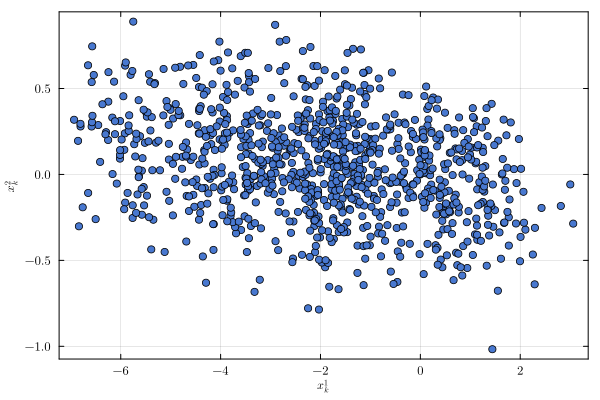

In [67]:
N = 1000
x₀ = zeros(Float64, 2,)
K₀ = [-0.2  -6.0]

X, U = f_dataGen_CL(x₀, K₀, N)
display(abs.(eigen(A + B * K₀).values))
plt = plot(
    framestyle = :box,
    yguidefontsize = 8,
    xguidefontsize = 8,
    xtickfontsize = 8,
    ytickfontsize = 8,
    ylabel = L"$x^2_k$",
    xlabel = L"$x^1_k$",
    palette = :seaborn_muted,
    legend=:none,
    foreground_color_legend = nothing,
    legendfontsize=5,
    fontfamily = "Computer Modern",
)
plot_data_exp = scatter!(plt, X[1,:], X[2,:], markershape = :circle, markersize = 4) 
#[:none, :auto, :circle, :rect, :star5, :diamond, :hexagon, :cross, :xcross, :utriangle, :dtriangle, :rtriangle, :ltriangle, :pentagon, :heptagon, :octagon, :star4, :star6, :star7, :star8, :vline, :hline, :+, :x].

We use the above input and state data, $U$ and $X$, respectively, to fit a linear model and design a new controller based on this identified model, in a certainty equivalence fashion.

In [68]:
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
sys_estimate = ss(Â,B̂,I,0,Δ)

K_CE = -lqr(sys_estimate,Q,R)

1×2 Matrix{Float64}:
 -0.640969  -1.08521

We now use this certainty equivalence control law to control the true system.

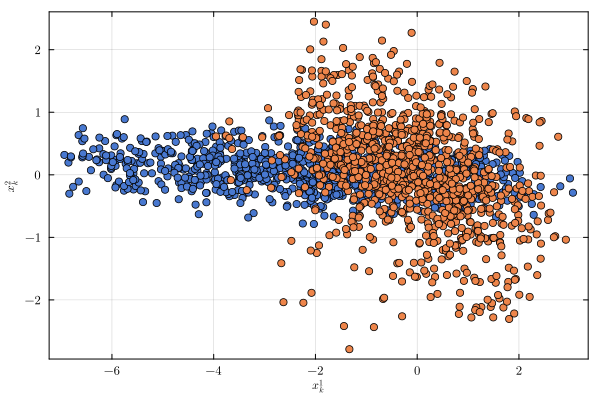

In [71]:
X_CE, _ = f_dataGen_CL(x₀, K_CE, N)
plot_CE = scatter(plot_data_exp, X_CE[1,:], X_CE[2,:])

1×2 Matrix{Float64}:
 -0.22098  -5.87146

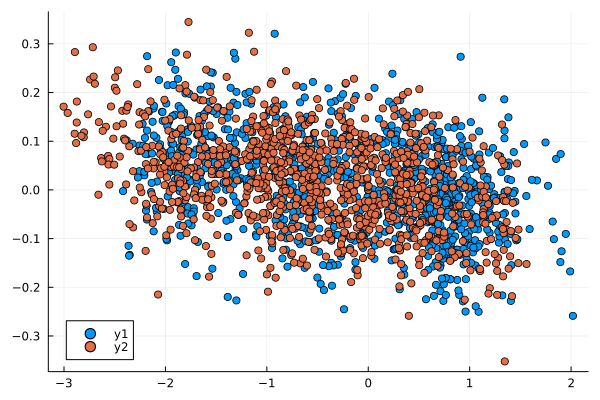

In [601]:
γ_F = 100000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') >= 0, PSDCone());
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') <= 0, PSDCone());

@constraint(model, [(Σ - Ad*Σ*Ad' - Bd*L*Ad' - Ad*L'*Bd' - W - Bd*V*Bd') Bd*L; L'*Bd' Σ] >= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

In [587]:
Z₀ - K_prob6 * Σ * K_prob6'

1×1 Matrix{Float64}:
 1.1087939547405057e-5

In [588]:
Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd')

2×2 Matrix{Float64}:
  6.37375e-9  -1.33386e-8
 -1.33386e-8  -1.63003e-8

1×2 Matrix{Float64}:
 -0.0919507  -2.65106

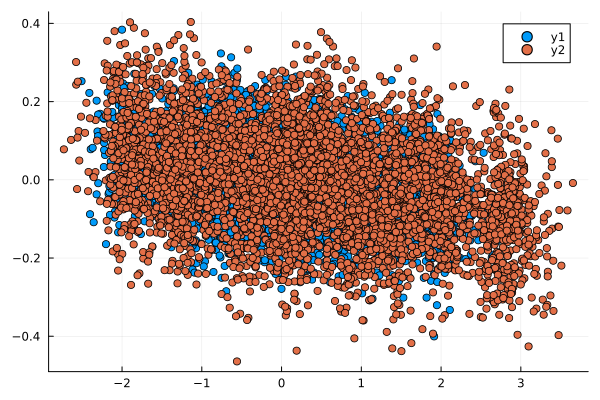

In [570]:
γ_F = 1000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') >= 0, PSDCone());
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') <= 0, PSDCone());

@constraint(model, [(Σ - Ad*Σ*Ad' - Bd*L*Ad' - Ad*L'*Bd' - W - Bd*V*Bd') Bd*L; L'*Bd' Σ] >= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

1×2 Matrix{Float64}:
 -0.0919507  -2.65106

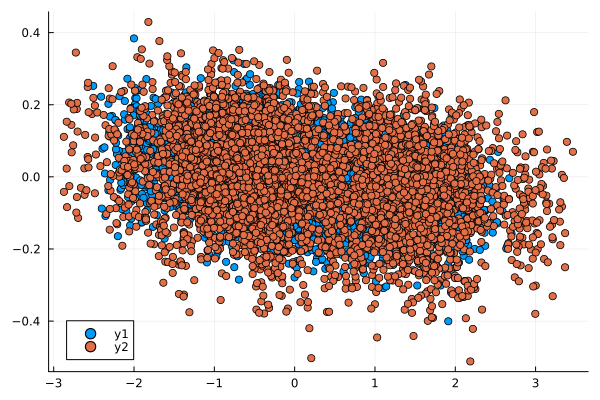

In [571]:
γ_F = 1000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') >= 0, PSDCone());
#@constraint(model, Σ - (Ad*Σ*Ad' + Bd*L*Ad' + Ad*L'*Bd' +  Bd*Z₀*Bd' + W + Bd*V*Bd') <= 0, PSDCone());

@constraint(model, [(Σ - Ad*Σ*Ad' - Bd*L*Ad' - Ad*L'*Bd' - W - Bd*V*Bd') Bd*L; L'*Bd' Σ] >= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

1×2 Matrix{Float64}:
 0.165305  -5.3863

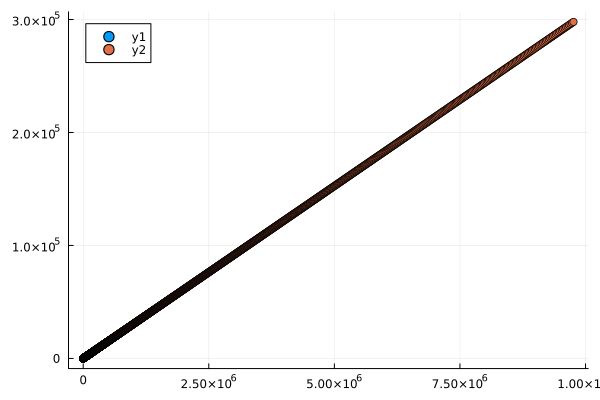

In [572]:
γ_F = 5000
Σ_data = 1/(N) * X * X'
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]

@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])

@objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

@constraint(model, Σ - (1e-6I) >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
@constraint(model, Ac*Σ + Bc*L + (Ac*Σ + Bc*L)' + W + Bc*V*Bc' >= 0, PSDCone());
@constraint(model, Ac*Σ + Bc*L + (Ac*Σ + Bc*L)' + W + Bc*V*Bc' <= 0, PSDCone());

@constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
#set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_prob6 = L * inv(Σ) 
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
scatter(X[1,:], X[2,:])
scatter!(X_prob6[1,:], X_prob6[2,:])

In [573]:
Z₀

1×1 Matrix{Float64}:
 0.5686158098661924

In [574]:
Z₀ - K_prob6 * Σ * K_prob6'

1×1 Matrix{Float64}:
 5.300449512635197e-8

In [575]:
Ac*Σ + Bc*L + (Ac*Σ + Bc*L)' + W + Bc*V*Bc'

2×2 Matrix{Float64}:
 -4.42364e-10  3.92056e-9
  3.92056e-9   1.83088e-9

In [589]:
Σ_data

2×2 Matrix{Float64}:
  0.997765   -0.0350536
 -0.0350536   0.00929078

In [590]:
Σ

2×2 Matrix{Float64}:
  0.997824   -0.0359268
 -0.0359268   0.00992886

In [534]:
norm(Σ - Σ_data)

0.054782507502622146